# Explore lnd_in file (surface data)

In [1]:
# mask the one beneath 60 degrees
# dominant vegetation -> fix natpft=12
# resolution of LPJ GUESS
# set titles and axis, title of the legend
# set caracter bigger
# bare ground? it dipends on the ice retrieve
# polynomial workes for longitute? --> just tress btw
#metti lat in vert
# linea sul massimo emostra shift insieme a prec
# mwtti a posto natpdf domnant, no PCT_ etc
# perch esolo range 40-80?

In [2]:
import numpy as np
import netCDF4 as nc
import xarray as xr
xr.set_options(display_style='html')
import cartopy
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import proplot as pplt

import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
from cartopy.util import add_cyclic_point
from owslib.wms import WebMapService
import os
from matplotlib.image import imread

In [3]:
# Import surface data file: 
fn='data/surfdata_1.9x2.5_hist_16pfts_Irrig_CMIP6_simyr2000_c190304.nc'
dset_in = xr.open_dataset(fn)

In [4]:
# Explore the imported dataset with its variables etc...
dset_in
# It's a three dimensional dset:
# - time
# - cft: number of CropFT
# - natpft: number of PlantFT
# and other dimensions
# variables: https://noresm-docs.readthedocs.io/en/latest/output/clm_standard_out.html

<xarray.Dataset>
Dimensions:                  (lsmlat: 96, lsmlon: 144, nlevsoi: 10, natpft: 15, cft: 2, time: 12, lsmpft: 17, numurbl: 3, numrad: 2, nlevurb: 5, nglcecp1: 11, nglcec: 10)
Coordinates:
  * natpft                   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * cft                      (cft) int32 15 16
  * time                     (time) int32 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: lsmlat, lsmlon, nlevsoi, lsmpft, numurbl, numrad, nlevurb, nglcecp1, nglcec
Data variables: (12/81)
    mxsoil_color             int32 ...
    SOIL_COLOR               (lsmlat, lsmlon) int32 ...
    PCT_SAND                 (nlevsoi, lsmlat, lsmlon) float64 ...
    PCT_CLAY                 (nlevsoi, lsmlat, lsmlon) float64 ...
    ORGANIC                  (nlevsoi, lsmlat, lsmlon) float64 ...
    FMAX                     (lsmlat, lsmlon) float64 ...
    ...                       ...
    CONST_HARVEST_SH2        (lsmlat, lsmlon) float64 ...
    CONST_HARVEST_SH3        (lsmlat, lsmlon) float64 ...
    CONST_GRAZING            (lsmlat, lsmlon) float64 ...
    CONST_FERTNITRO_CFT      (cft, lsmlat, lsmlon) float64 ...
    UNREPRESENTED_PFT_LULCC  (natpft, lsmlat, lsmlon) float64 ...
    UNREPRESENTED_CFT_LULCC  (cft, lsmlat, lsmlon) float64 ...
Attributes: (12/50)
    Conventions:                          NCAR-CSM
    History_Log:                          created on: 03-04-19 21:18:11
    Logname:                              erik
    Host:                                 cheyenne3
    Source:                               Community Land Model: CLM5
    Version:                              release-clm5.0.18/gpfs/fs1/scratch/...
    ...                                   ...
    map_vic_file:                         map_0.9x1.25_GRDC_to_1.9x2.5_nomask...
    Soil_texture_raw_data_file_name:      mksrf_soitex.10level.c010119.nc
    Soil_color_raw_data_file_name:        mksrf_soilcolor_CMIP6_simyr2005.c17...
    Fmax_raw_data_file_name:              mksrf_fmax_3x3min_USGS_c120911.nc
    Organic_matter_raw_data_file_name:    mksrf_organic_10level_5x5min_ISRIC-...
    Vegetation_type_raw_data_filename:    mksrf_landuse_histclm50_LUH2_2000.c...

In [5]:
#Set the longitude and latitude
dset_in['lsmlat'] = dset_in['LATIXY'].isel(lsmlon=0) #or dset_in['lsmlat'] = dset_in['lat']
dset_in['lsmlon'] = dset_in['LONGXY'].isel(lsmlat=0)

# Select PFT: percent plant functional type on the natural veg landunit (% of landunit)
# OBS! variable is centered, related to the ammount of land (full coloured even if )
pfts = dset_in.PCT_NAT_PFT
pfts = pfts.rename({'lsmlat':'lat','lsmlon':'lon'})
pfts

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 15, lat: 96, lon: 144)>
[207360 values with dtype=float64]
Coordinates:
  * natpft   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

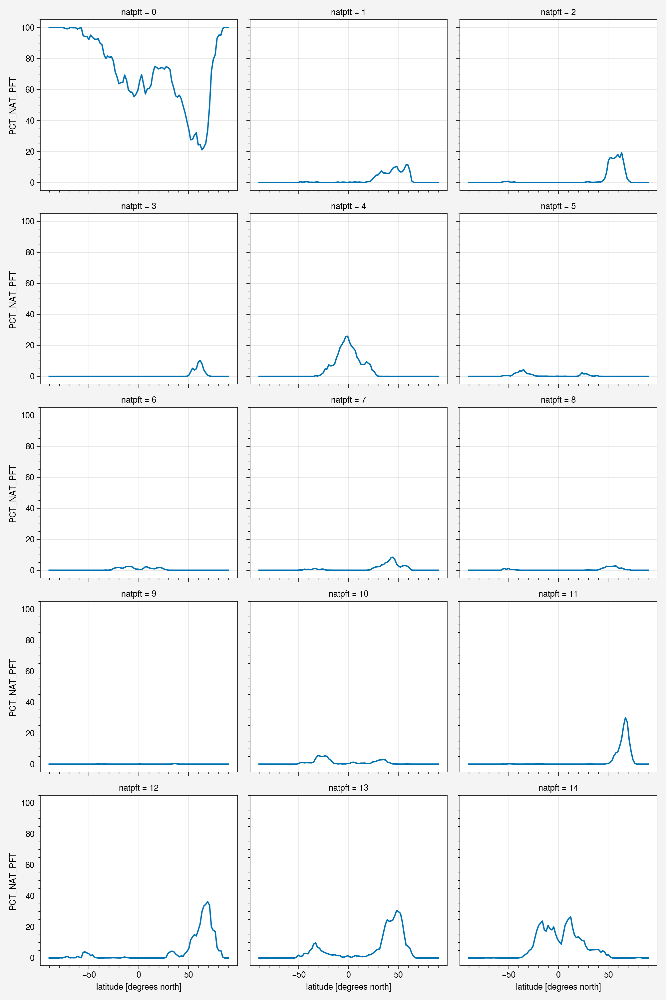

In [231]:
pfts.mean('lon').plot(col='natpft', col_wrap=3)

In [6]:
# BOREAL NAT PDFs:
# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# - 11: BDS Boreal
# - 12: artic C3 grass
# - 13: C3 grass
# - 14: C4 grass
#Others:
# - 0: Bare Ground
# - 1: NET Temperate
# - 4: BET Tropical
# - 5: BET Temperate
# - 6: BDT Tropical
# - 7: BDT Temperate
# - 10: BDS Temperate

## Maps

### Quick overview of the PFTs

In [7]:
#pfts.isel(natpft=slice(2,3)).plot()

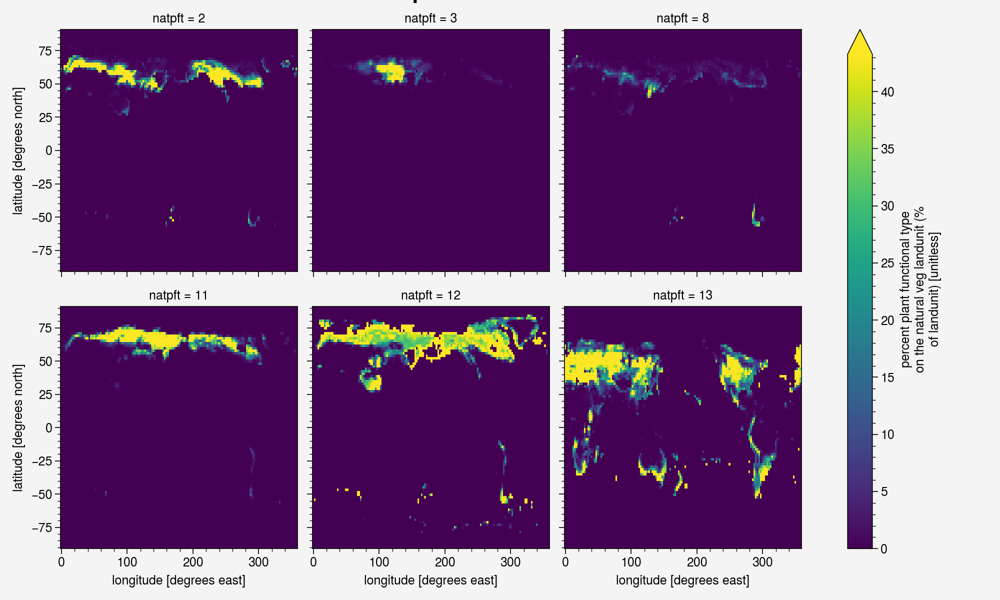

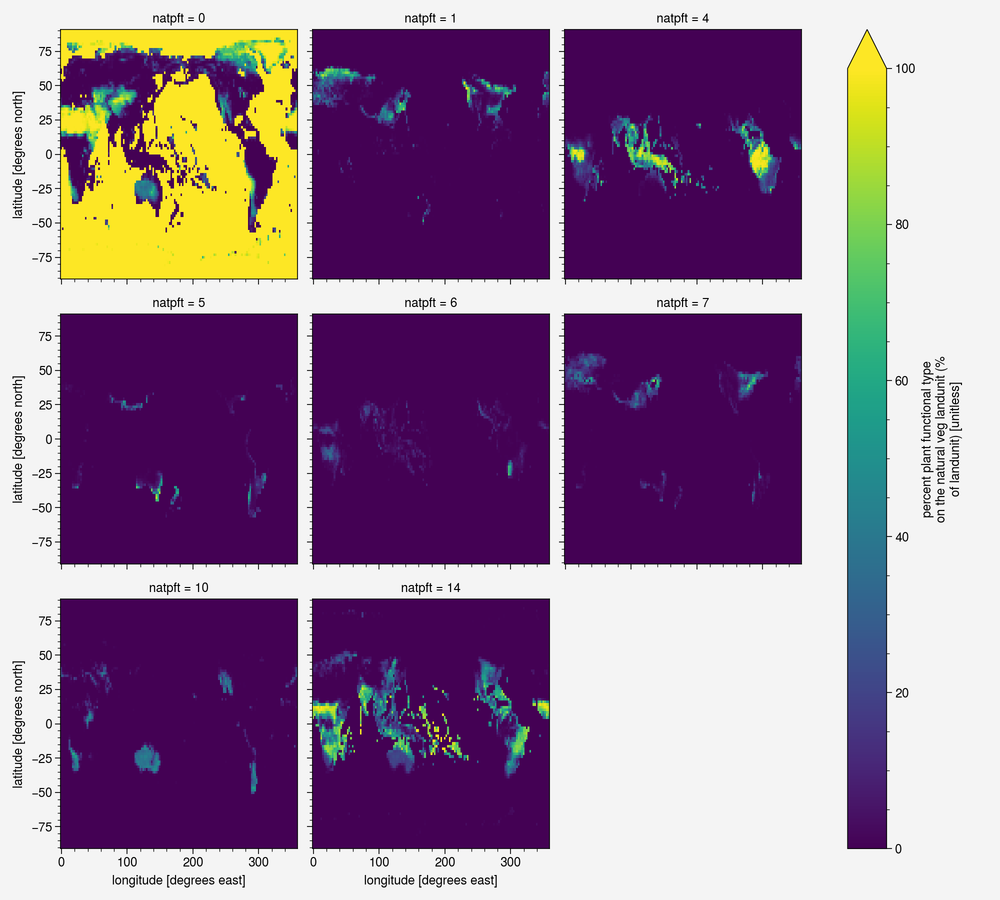

In [8]:
p = pfts.isel(natpft=[2,3,8,11,12,13]).plot(x='lon', y='lat', col='natpft', col_wrap=3,robust=True, cmap='viridis')
p.fig.suptitle("Expected Boreal PFTs",y=1.03, size='xx-large')

p= pfts.isel(natpft=[0,1,4,5,6,7,10,14]).plot(x='lon', y='lat', col='natpft', col_wrap=3,robust=True, cmap='viridis')
p.fig.suptitle("Expected non-Boreal PFTs",y=1.03, size='xx-large')
plt.show()

### Select PFTs in the boreal zone:
With a closer look to the natpft, we select out C3 grass and include the bareground (?)

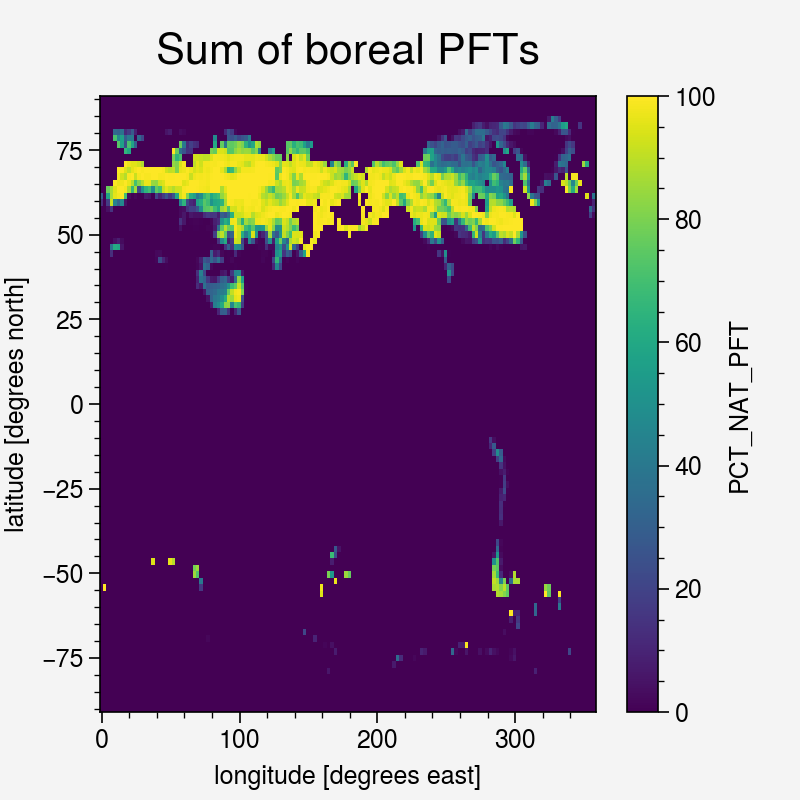

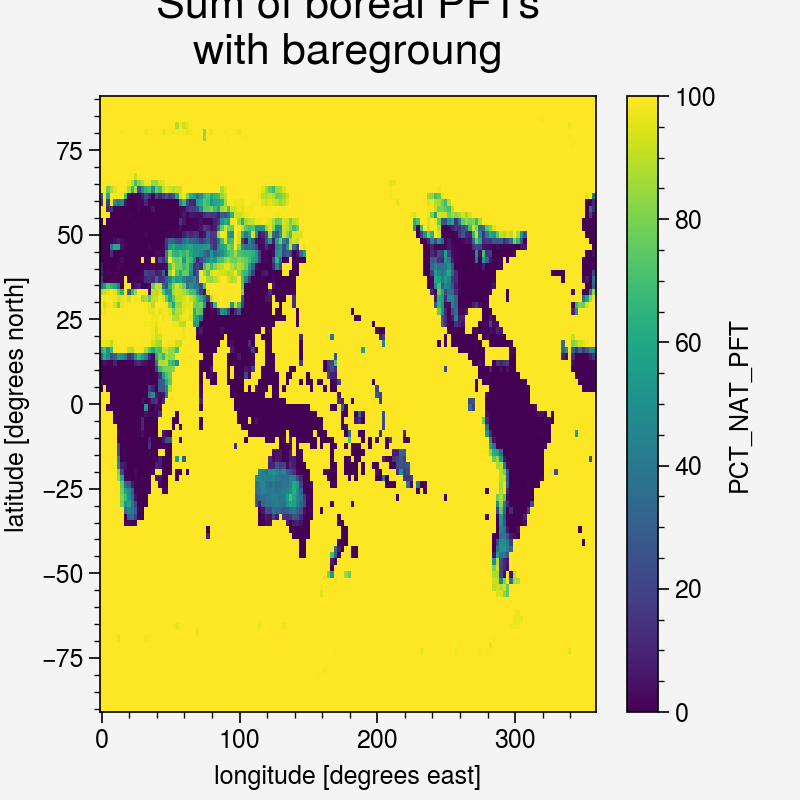

In [9]:
boreal_pfts=[2,3,8,11,12]
pfts_b=pfts.sel(natpft=boreal_pfts)
pfts_b.sum('natpft').plot(x='lon', y='lat')
plt.title("Sum of boreal PFTs",y=1.03, size='xx-large')
plt.show()

pfts_b=pfts.sel(natpft=[0,2,3,8,11,12])
pfts_b.sum('natpft').plot.pcolormesh()
plt.title("Sum of boreal PFTs\nwith baregroung",y=1.03, size='xx-large')
plt.show()

For a first analysis, I will consider no bareground
## Mask

Note: trying con Bareground, summimg up with skip_na=True, then set nan lots of more points than expected --> that means that except for bareground the other natpfts have nan as values where is largely zero (like ocean). Good to know! skipna need to be False to avoid baised. But then where>0. (masking) need to be done later.

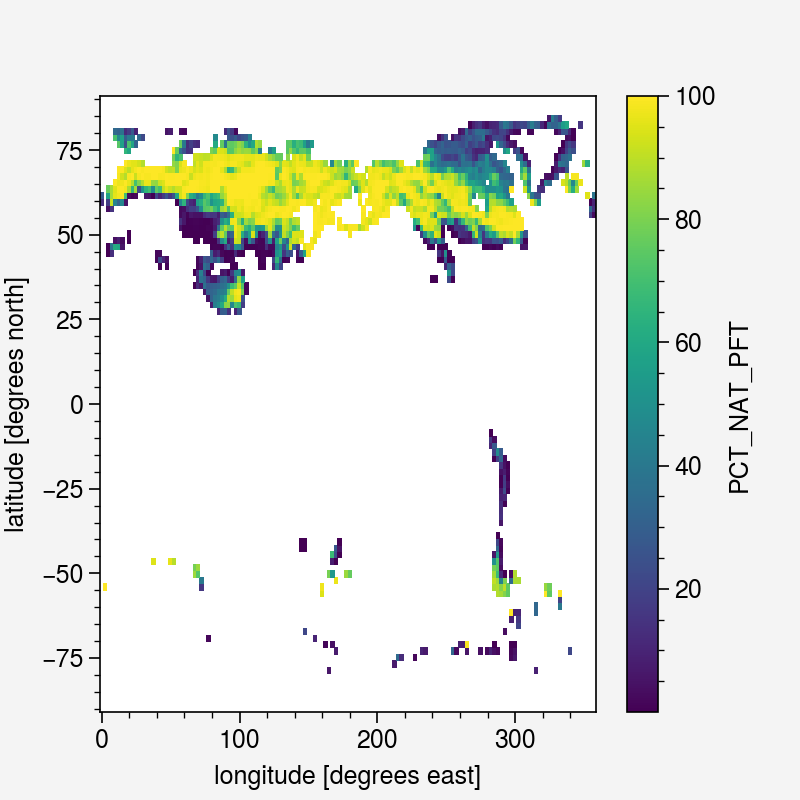

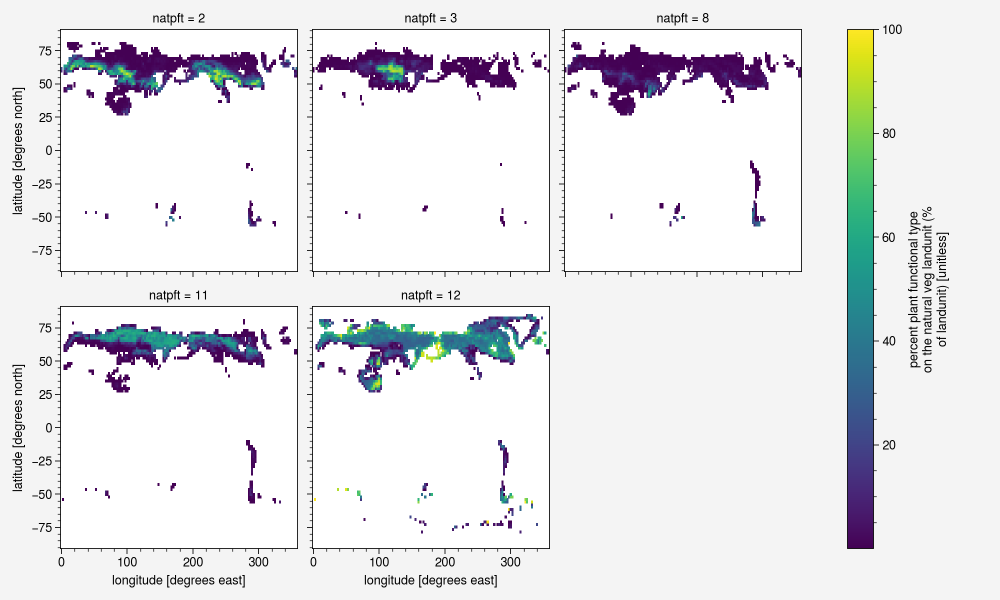

In [198]:
pfts_b=pfts.sel(natpft=boreal_pfts)
pfts_b_mask = pfts_b.where(pfts_b>0.)
#pftsmask    = pftsmask.rename({'natpft':'pft','lsmlat':'lat','lsmlon':'lon'})
#pfts_b_mask.sum('natpft').plot.pcolormesh() #, skipna=False
pfts_sum=pfts_b.sum('natpft')
pfts_sum=pfts_sum.where(pfts_sum>0.)
pfts_sum.plot()
plt.show()


#ax = plt.axes()
#pfts_sum.plot.contourf(ax=ax)
#ax.set_facecolor('red')

pfts_b_mask.plot(x='lon', y='lat', col='natpft', col_wrap=3,cmap='viridis')
plt.show()

In [11]:
#pfts.isel(natpft=[0,2,3,8,11,12]).where(pfts>0.).sum('natpft', skipna=False).plot()
#pfts_b_mask.sum('natpft', skipna=False).plot()

## Maps - prettier
Change projection and mask base on latitude

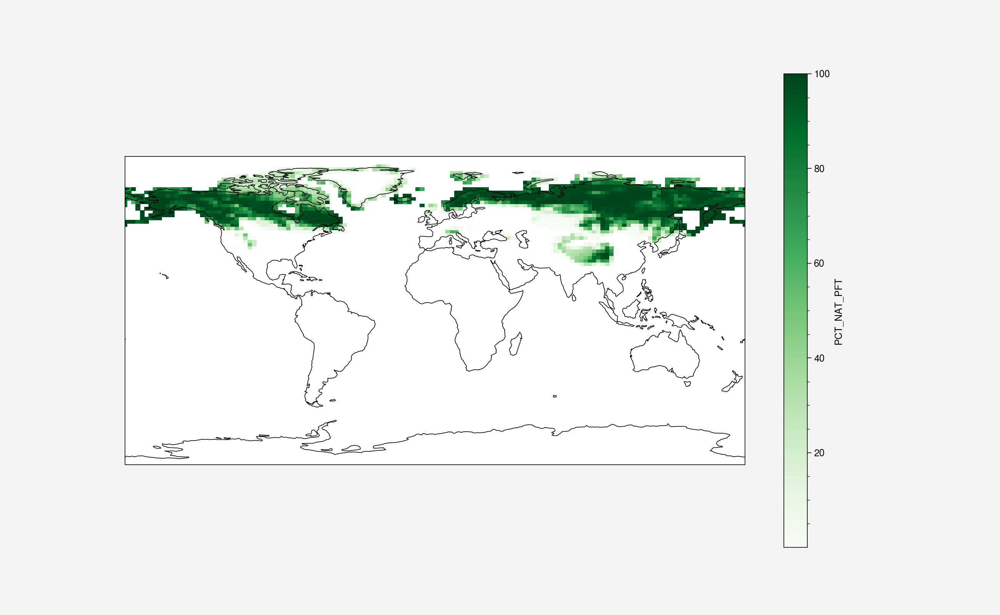

In [12]:
pfts_sum=pfts_sum.where(pfts_sum.lat>0)
pfts_b_mask = pfts_b_mask.where(pfts_b_mask.lat>0.)


fig = plt.figure(1, figsize=[13,8])
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines()

pfts_sum.plot.pcolormesh(ax=ax, x='lon', y='lat', cmap='Greens')
#plt.tight_layout()
plt.show()

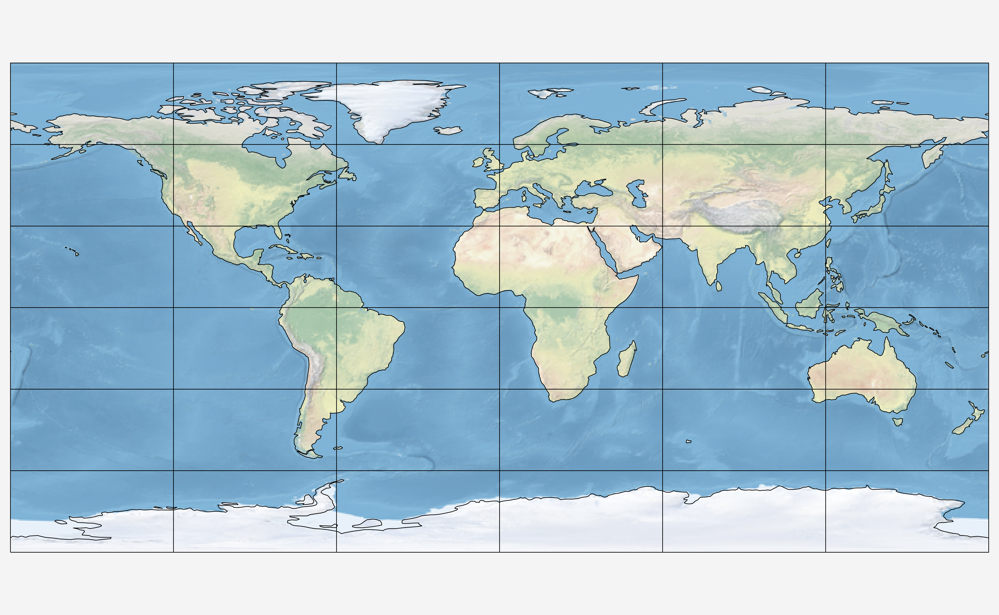

In [13]:
np.random.seed(1)
x = 360 * np.random.rand(50)
y = 180 * np.random.rand(50) - 90

fig = plt.figure(1, figsize=[13,8],dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())#central_longitude=-79))
ax.scatter(x, y,alpha=0)
ax.stock_img()
ax.coastlines()
ax.gridlines()
plt.tight_layout()
plt.show()

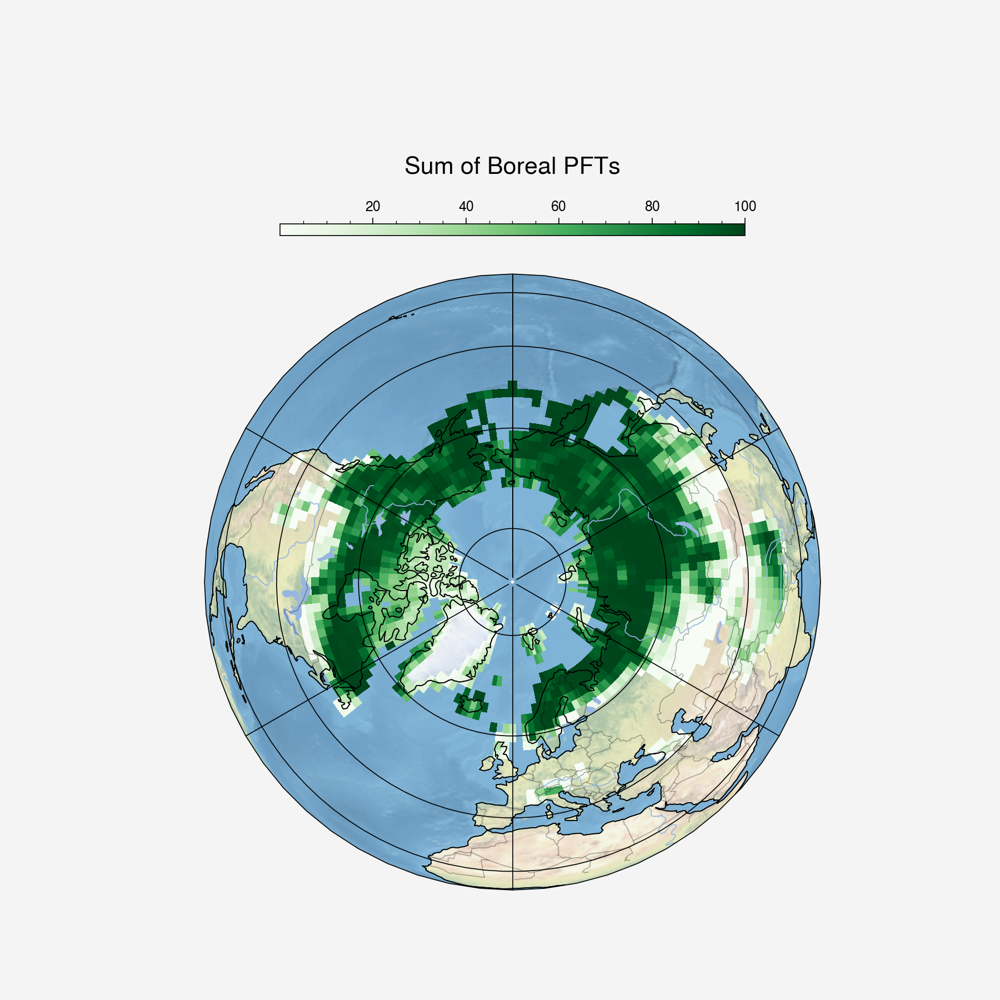

In [14]:
fig = plt.figure(1, figsize=[9,9])#,dpi=100)
provinces_50m = cfeature.NaturalEarthFeature('cultural',
                                             'admin_1_states_provinces_lines',
                                             '50m',
                                             facecolor='none')

ax = plt.axes(projection=ccrs.Orthographic(0, 90))

#ax.add_feature(cartopy.feature.OCEAN, zorder=0)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black')
ax.coastlines()
ax.gridlines()

p= pfts_sum.plot.pcolormesh(ax=ax, x='lon', y='lat', cmap='Greens', vmax=100,transform=ccrs.PlateCarree(), add_colorbar=False)#, 
                         #cbar_kwargs={'orientation': 'horizontal', 'shrink':0.6, 'aspect':40})#,"pad": 1.11}) #'label':'Percent Deviation', 'extend':'both',  'fraction':0.046})
#ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=0.3)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=0.3)
cbar = plt.colorbar(p,ax = [ax], location = 'top', shrink=0.6, aspect=40)

ax.add_feature(cfeature.LAKES)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, alpha=0.3)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(provinces_50m)
#fname = os.path.join('/Users/adelezaini/Downloads/NE1_50M_SR_W/', 'NE1_50M_SR_W.tif')
#ax.imshow(imread(fname), origin='upper', transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])
url = 'http://map1c.vis.earthdata.nasa.gov/wmts-geo/wmts.cgi'
#ax.add_wmts(url, 'VIIRS_CityLights_2012')#'BlueMarble_NextGeneration')
ax.stock_img()
plt.title("Sum of Boreal PFTs", y=1.15, size='xx-large')
plt.tight_layout()
plt.show()

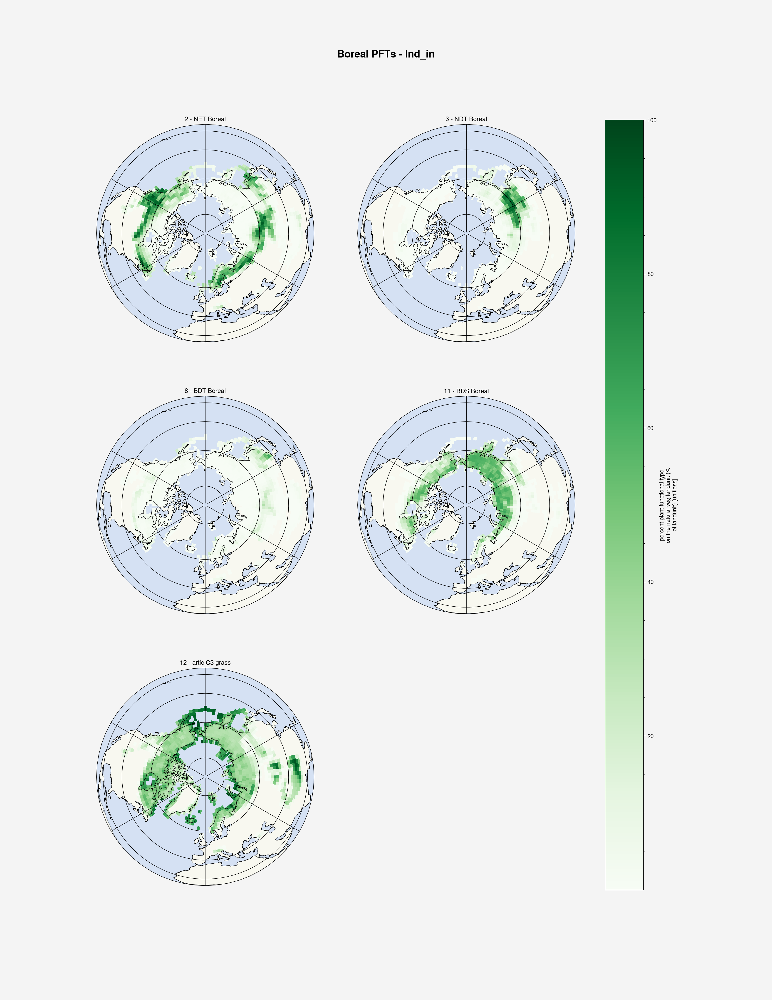

In [15]:
proj = ccrs.PlateCarree()
map_proj = ccrs.Orthographic(0, 90)

titles=['2 - NET Boreal','3 - NDT Boreal','8 - BDT Boreal','11 - BDS Boreal','12 - artic C3 grass']

p=pfts_b_mask.plot.pcolormesh(x='lon', y='lat', col='natpft', col_wrap=2,
                              cmap='Greens', transform=proj, 
                              subplot_kws={'projection':map_proj},
                              figsize=(17, 22)) #robust=True,


for i, ax in enumerate(p.axes.flat):
    ax.coastlines()
    ax.gridlines()
    ax.add_feature(cartopy.feature.OCEAN, alpha=0.4)
    ax.add_feature(cartopy.feature.LAND, edgecolor='black', alpha=0.4)
    #ax.stock_img()
    if i<5: 
        ax.set_title(titles[i])

plt.suptitle("Boreal PFTs - lnd_in", fontsize = 16, y = 0.95, fontweight = 'bold')
p.fig.tight_layout()
plt.show()

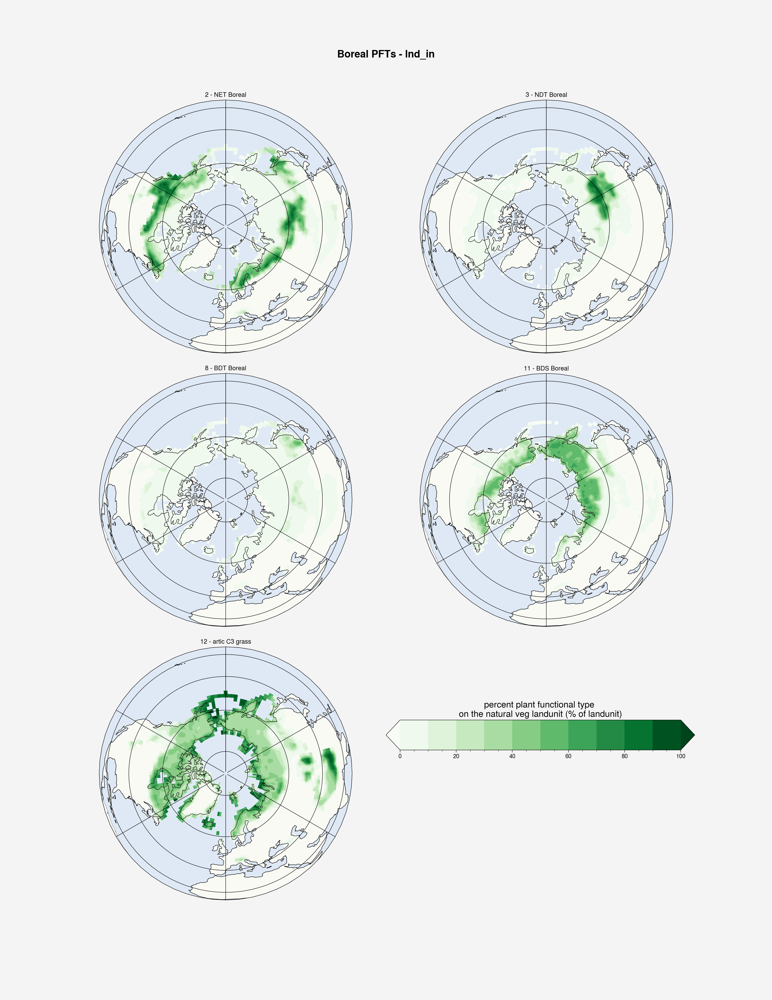

In [16]:
proj = ccrs.PlateCarree()
map_proj = ccrs.Orthographic(0, 90)

titles=['2 - NET Boreal','3 - NDT Boreal','8 - BDT Boreal','11 - BDS Boreal','12 - artic C3 grass']

p=pfts_b_mask.plot.pcolormesh(x='lon', y='lat', col='natpft', col_wrap=2,
                              cmap='Greens', transform=proj, 
                              subplot_kws={'projection':map_proj},
                              add_colorbar=False,figsize=(17, 22)) #robust=True


for i, ax in enumerate(p.axes.flat):
    ax.coastlines()
    ax.gridlines()
    ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=0.3)
    ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=0.3)
    if i<5: 
        ax.set_title(titles[i])
        data,lons=add_cyclic_point(pfts_b_mask.isel(natpft=i).values,coord=pfts_b_mask['lon'])
        cs=ax.contourf(lons,pfts_b_mask['lat'],data, transform = proj, 
                            cmap ='Greens', extend='both', levels = np.linspace(0,100, 11) )

plt.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.08, hspace=0.08)
cbar_ax = p.fig.add_axes([0.5, 0.25, 0.4, 0.03]) #[left, bottom, width, height]
cbar=p.fig.colorbar(cs,cax=cbar_ax ,orientation='horizontal')
cbar.ax.set_title('percent plant functional type \non the natural veg landunit (% of landunit)', size = 14 )

plt.suptitle("Boreal PFTs - lnd_in", fontsize = 16, y = 0.95, fontweight = 'bold')
#p.fig.tight_layout()
plt.show()

## Dominant vegetation

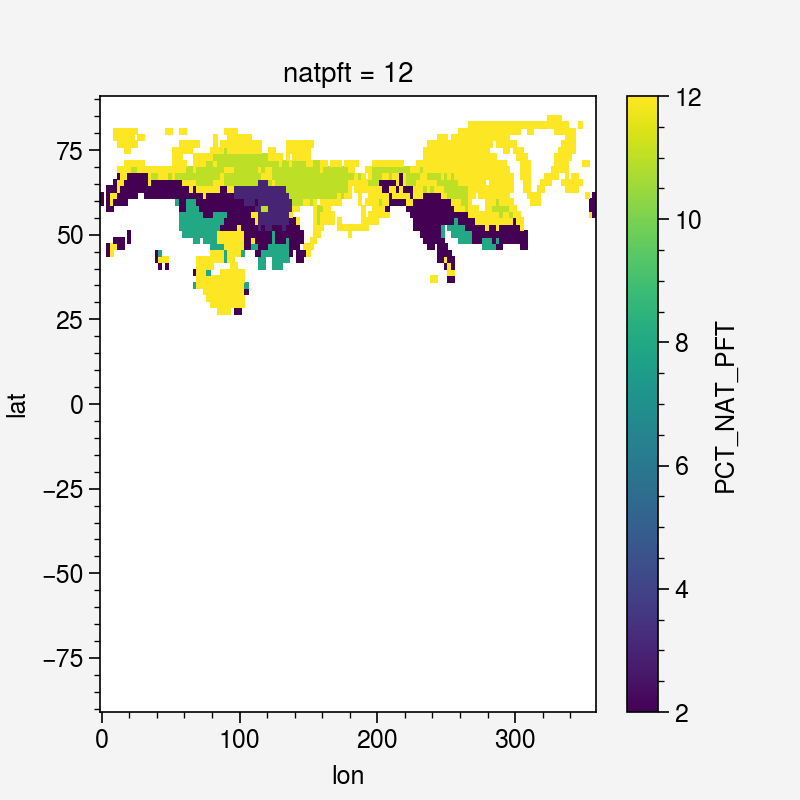

In [17]:
dominant_veg = pfts_b_mask.sel(natpft=boreal_pfts[0]).copy()
dominant_veg[:] = boreal_pfts[0]
dominant_veg= dominant_veg.where(pfts_sum>0.)
#dominant_veg.plot()
#plt.show()

#print(pfts_b_mask.values.flatten().shape)
#pfts_b_mask.values.shape

pfts_max = pfts_b_mask.max(dim='natpft')
#pfts_max.plot()
#plt.show()

for bp in range(len(boreal_pfts)):
    #print(bp, boreal_pfts[bp])
    pft_filter=pfts_b_mask.sel(natpft=boreal_pfts[bp]) == pfts_max
    dominant_veg = xr.where(pft_filter, boreal_pfts[bp],dominant_veg)
    #dominant_veg.plot()
    plt.show()
    
dominant_veg=dominant_veg.where(pfts_sum>0.)
dominant_veg.plot()

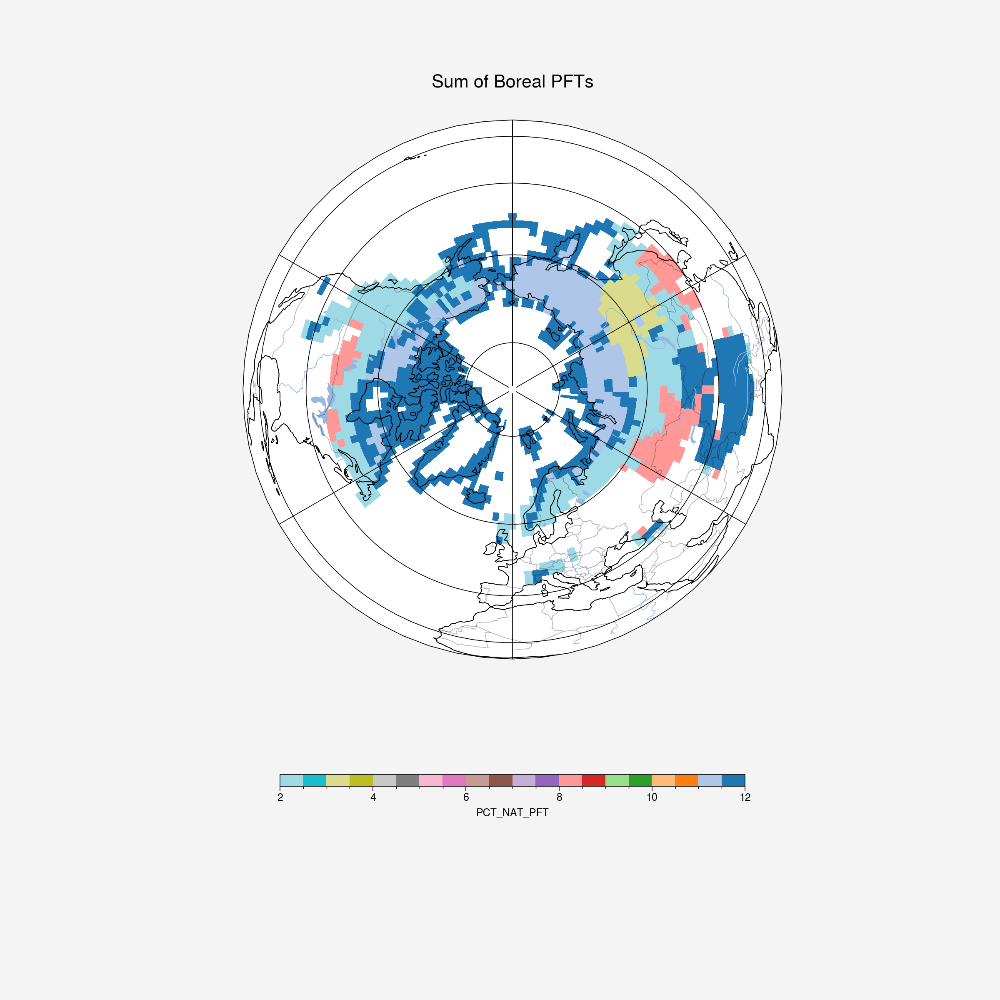

In [18]:
fig = plt.figure(1, figsize=[12,12]) #dpi=100

ax = plt.axes(projection=ccrs.Orthographic(0, 90))

#ax.add_feature(cartopy.feature.OCEAN, zorder=0)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black')
ax.coastlines()
ax.gridlines()

dominant_veg.plot.pcolormesh(ax=ax, x='lon', y='lat', cmap='tab20_r', transform=ccrs.PlateCarree(),#, add_colorbar=False)#, 
                         cbar_kwargs={'orientation': 'horizontal', 'shrink':0.6, 'aspect':40})#,"pad": 1.11}) #'label':'Percent Deviation', 'extend':'both',  'fraction':0.046})
#plt.colorbar(p,ax = [ax], location = 'top', shrink=0.6, aspect=40, cmap='tab20_r')
                         
#ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=0.3)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=0.3)
ax.add_feature(cfeature.LAKES)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, alpha=0.3)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(provinces_50m)
#fname = os.path.join('/Users/adelezaini/Downloads/NE1_50M_SR_W/', 'NE1_50M_SR_W.tif')
#ax.imshow(imread(fname), origin='upper', transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])
url = 'http://map1c.vis.earthdata.nasa.gov/wmts-geo/wmts.cgi'
#ax.add_wmts(url, 'VIIRS_CityLights_2012')#'BlueMarble_NextGeneration')
#ax.stock_img()
plt.title("Sum of Boreal PFTs", y=1.05, size='xx-large')
plt.tight_layout()
plt.show()

## Modify the PFTs configuration
### Idea 
1. For each PFT I find:
- a function on latitude: in order to apply the shift 

[not no function otherwise at 90° shrub can be substitute by lets say 20% as it was at 60°]
- a function on longitude:this is why there is not just one kind of trees so this can be proxy

--->? by mean? or sum then normalise, or max....

Then I create bar plots for each lat and lon I have like 20% of BET, 10% of BDT... (natpft colors)

2. apply the latitude shift.

This is a "mask" to ...

3. apply then in the close relation trees -> shrubs, shrubs -> grass, grass -> bg?

Ex: in cell 20% shrubs at 60° now, then it will be that 20% of shrubs substitute by 30% (30 of 20%) of BET (30% data by "mask")
Note: if the mask says 30%, it's the direct percentage of PFT in the "lower" cell, but it can be tuned so it is normalize to 100% let's say.

? include also temperate that substite boreal trees?

### 1. Function of latitude

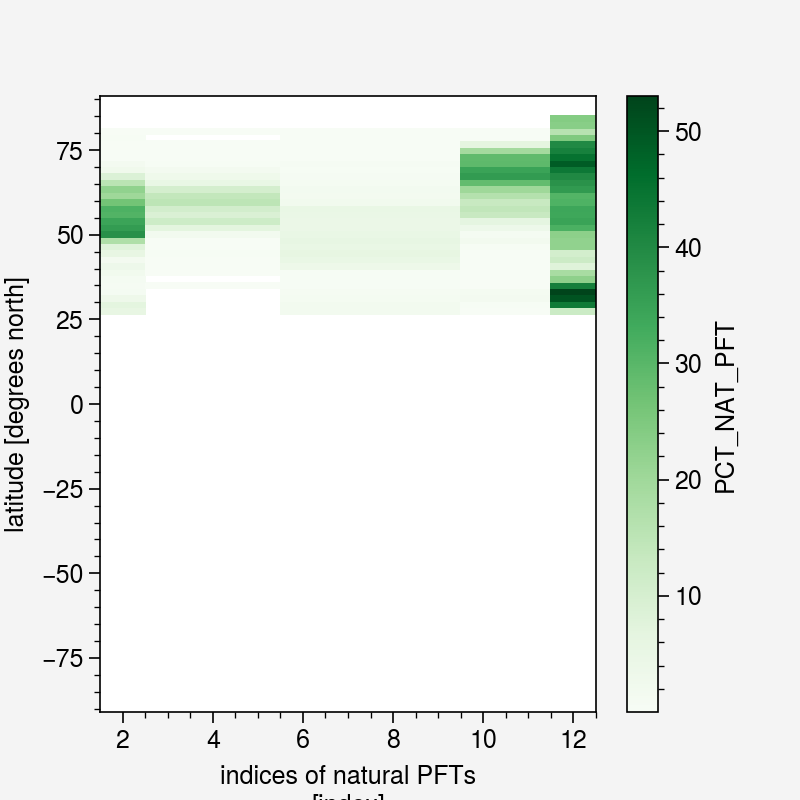

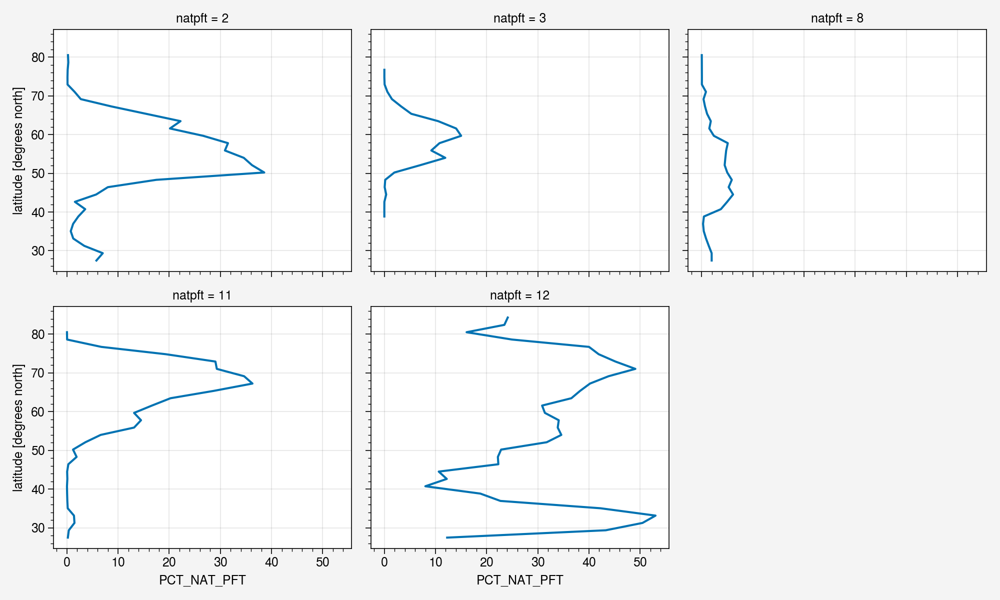

In [19]:
pfts_b_mask.mean('lon').plot(y='lat', cmap='Greens')
plt.show()
pfts_b_mask.mean('lon').plot(y='lat', col='natpft', col_wrap=3)
plt.show()

### 1. Function of latitude - polynomial fit

I filter over lat >10 deg, outside the boreal zone

**OBS!** 'dropna' and 'fillna' are very important to render well the fitting in the target lat range - outside the range the polynomial gives wierd shapes.
But 'dropna' needs to be specify how=all, because otherwise extra rows are dropped, if there is just 1! NaN values!

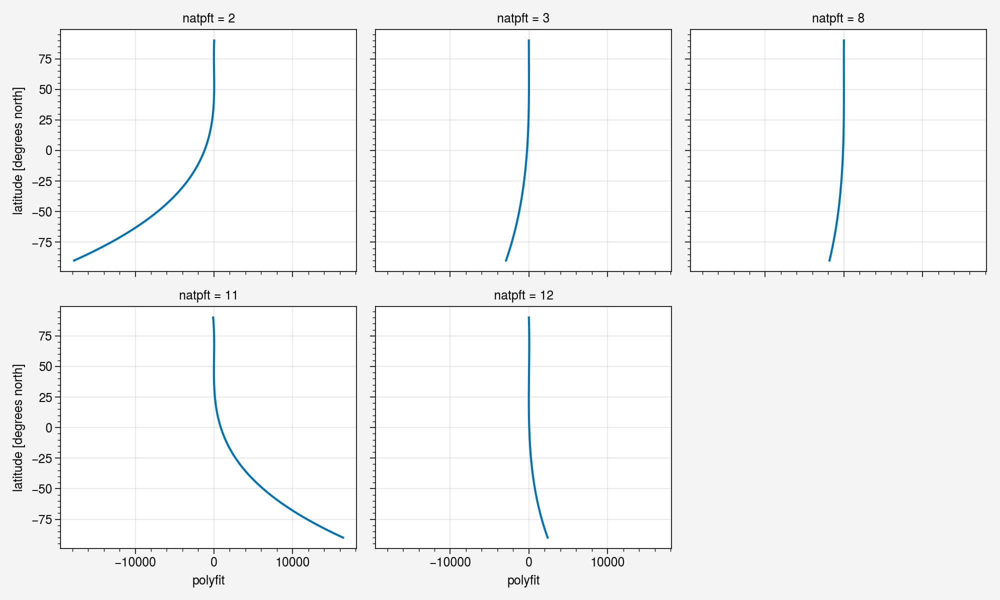

In [221]:
ds = pfts_b_mask.copy()
ds_lat=ds.mean('lon')
ds_lat = ds_lat.where(ds_lat.lat> 40.).dropna('lat', how='all').fillna(0.)
#ds_lat.plot(y='lat', col='natpft', col_wrap=3)
#plt.show()
out = ds_lat.polyfit(dim="lat", deg=3, full=True)
polyfit = xr.polyval(coord=ds_lat.lat, coeffs=out.polyfit_coefficients).rename('polyfit')
polyfit.plot(y='lat', col='natpft', col_wrap=3)
plt.show()

### 1. Function of latitude - gaussian fit
Better to render presence probability of the PFTs

**OBS**: the fitting didn't work without 'p0' (guessed parameters)

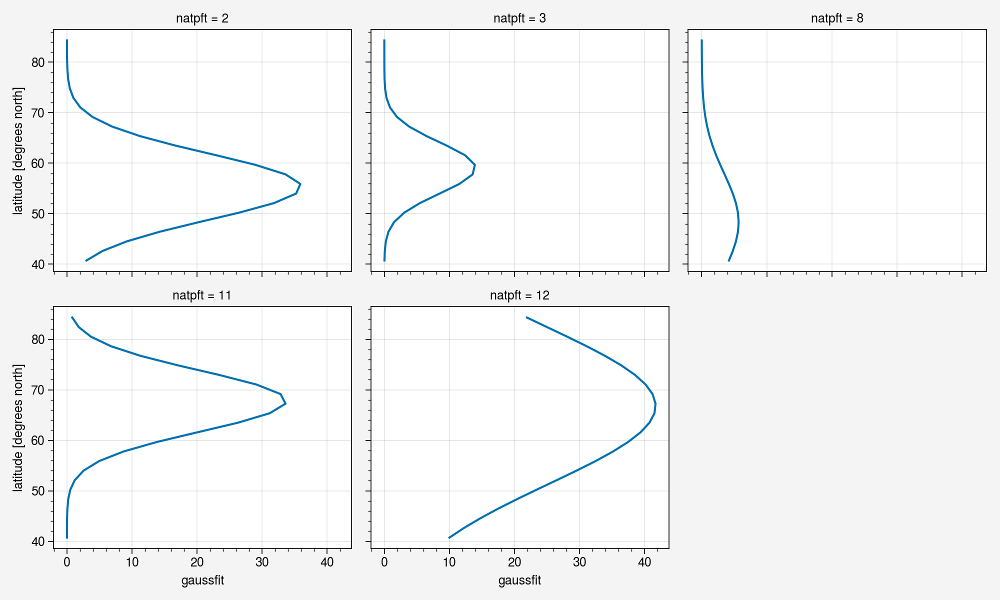

In [218]:
def gaussian(x, A, xc, sig):
    return A*np.exp(-np.power((x - xc),2.) / (2 * np.power(sig,2.)))

#ds = pfts_b_mask.copy()
#ds_lat=ds.mean('lon').dropna(dim='lat')#fillna(0.)
#ds_lat.plot(y='lat', col='natpft', col_wrap=3); plt.show()

fit_params=ds_lat.curvefit(coords='lat', func=gaussian, p0={'A':45, 'xc':55, 'sig':5})
#display(fitted)
popt=fit_params.curvefit_coefficients # NO! .values
gaussfit = gaussian(ds_lat.lat, *popt.T).drop('param').rename('gaussfit')
gaussfit.plot(y='lat',col='natpft', col_wrap=3)
plt.show()

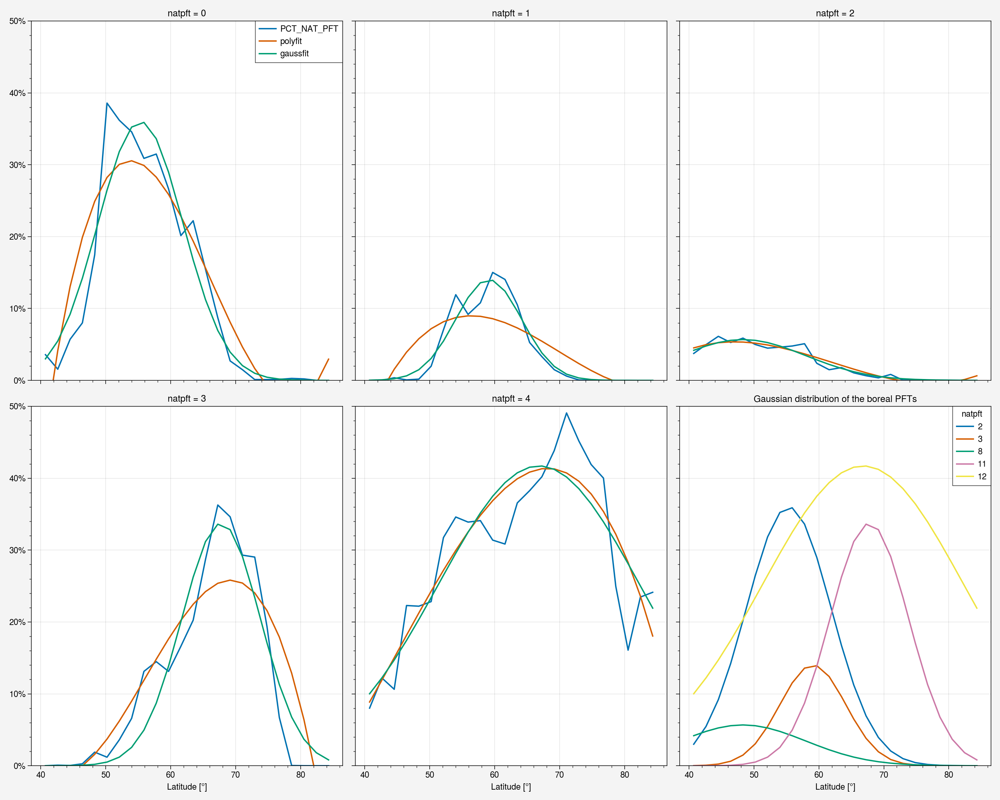

In [219]:
ds_lat = xr.merge([ds_lat, polyfit.T, gaussfit.T])#.plot.line(x='lat',col='natpft', col_wrap=3) #.rename('rawdata')

lines = ['PCT_NAT_PFT','polyfit','gaussfit']

fig, axes = plt.subplots(2, 3, figsize=[15,12], sharex=True, sharey=True)
#fig.delaxes(axes.flatten()[5])

for b, ax in enumerate(axes.flat):
    if b == 5:
        #continue
        #ax.legend(handles=lines)
        #ax.set_visible(False)
        ax.plot(ds_lat.lat, ds_lat.gaussfit)
        ax.legend(boreal_pfts, title='natpft')#, frameon=False)
        ax.set_xlabel('Latitude [°]')
        ax.set_title("Gaussian distribution of the boreal PFTs")
    else:
        for l in lines:
            ax.plot(ds_lat.lat, ds_lat.isel(natpft= b)[l], label=l)
            ax.set_ylim(0,50)
            ax.set_yticklabels(['{0:g}%'.format(x) for x in ax.get_yticks()])
            ax.set_title('natpft = '+str(b))
            if b==3 or b==4:
                ax.set_xlabel('Latitude [°]')
            if b==0:
                ax.legend()

#fig.add_axes()
#axes.flat[-1].legend(lines)
plt.tight_layout()
#plt.legend(lines)
plt.show()

#plt.plot(ds_lat.lat, ds_lat.gaussfit)
#plt.legend(boreal_pfts)
#plt.show()

The polyfit is not appropriate, also theoretically speaking, we are looking for a probability distribution as a "bell" shape: with a peak and desending curves on the side.

Different is the point of the longitude where I need to see the avarage distribution in relation to longitude (e.g. related to land/ocean presence) --> polyfit is simple but we are aiming to make a simple model.

### 3. Apply the shift on latitude

This will be the dataset with the percentage to apply in the substitution.
**Set the latitude shift to tune the percentage.**

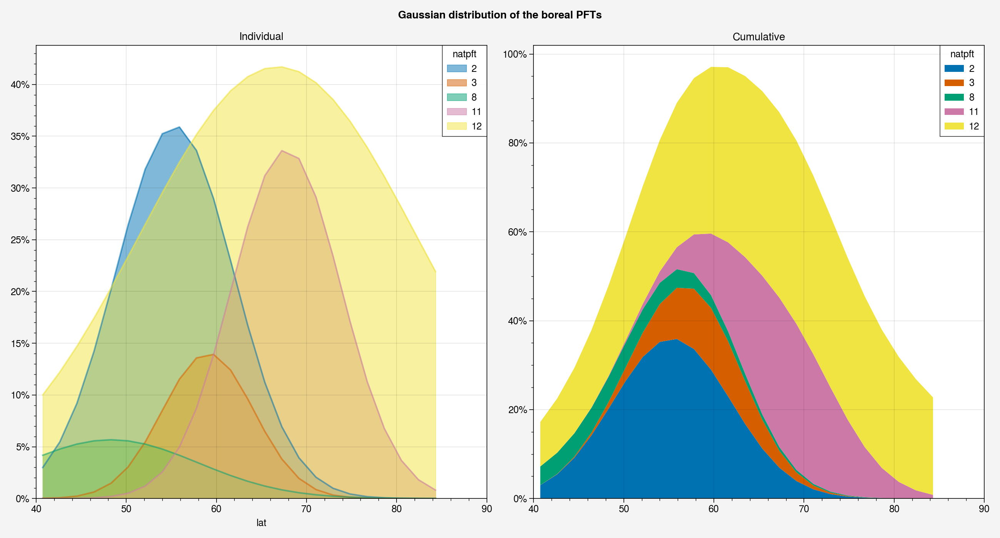

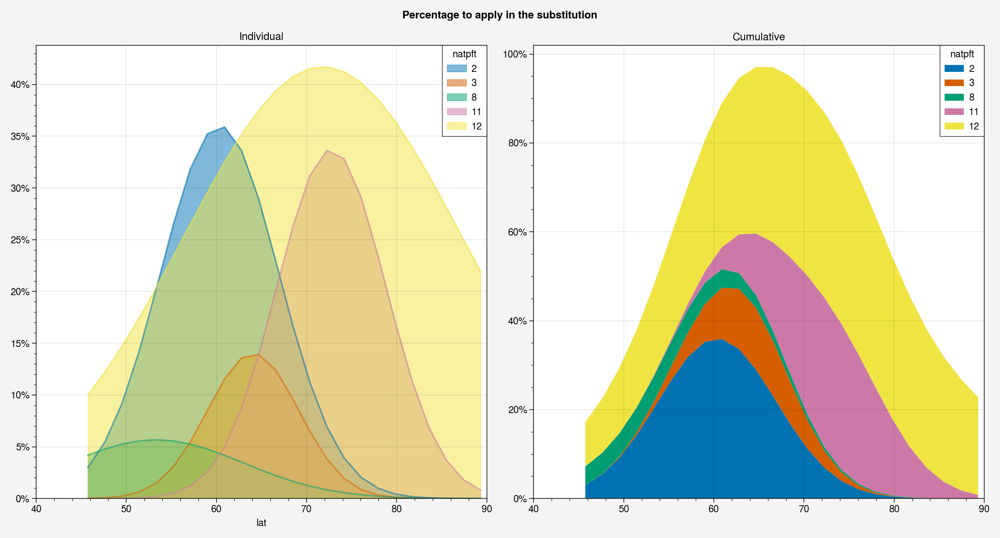

In [220]:
fig, axes = plt.subplots(1,2,figsize=(13, 7))
series = ds_lat['gaussfit'].rename('').to_series().unstack()
#series.plot.bar(ax=ax, stacked=True)
series.plot.area(ax=axes[0], stacked=False, title="Individual")

axes[1].stackplot(ds_lat.lat, ds_lat.gaussfit.T)
axes[1].legend(boreal_pfts, title='natpft')
axes[1].set_title("Cumulative")

for b, ax in enumerate(axes.flat):
    vals = ax.get_yticks()
    ax.set_yticklabels(['{0:g}%'.format(x) for x in vals])
    ax.set_xlim(40,90)

plt.suptitle("Gaussian distribution of the boreal PFTs")

plt.tight_layout()
plt.show()

shift=5.
ds_lat_perc=ds_lat.gaussfit.rename('').copy()
ds_lat_perc=ds_lat_perc.assign_coords({'lat': ds_lat_perc.lat+shift})
#filter if the shift is too high
ds_lat_perc=ds_lat_perc.where(ds_lat_perc.lat<=90.)

fig, axes = plt.subplots(1,2,figsize=(13, 7))
series = ds_lat_perc.to_series().unstack()
#series.plot.bar(ax=ax, stacked=True)
series.plot.area(ax=axes[0], stacked=False, title="Individual")

axes[1].stackplot(ds_lat_perc.lat, ds_lat_perc.T)
axes[1].legend(boreal_pfts, title='natpft')
axes[1].set_title("Cumulative")

for b, ax in enumerate(axes.flat):
    vals = ax.get_yticks()
    ax.set_yticklabels(['{0:g}%'.format(x) for x in vals])
    ax.set_xlim(40,90)

plt.suptitle("Percentage to apply in the substitution")

plt.tight_layout()
plt.show()

In [214]:
c = ds_lat_perc.where(ds_lat_perc==ds_lat_perc.max())
c.dropna('lat', how='all')

<xarray.DataArray '' (lat: 1, natpft: 5)>
array([[        nan,         nan,         nan,         nan, 41.92187977]])
Coordinates:
  * natpft   (natpft) int32 2 3 8 11 12
  * lat      (lat) float64 72.26

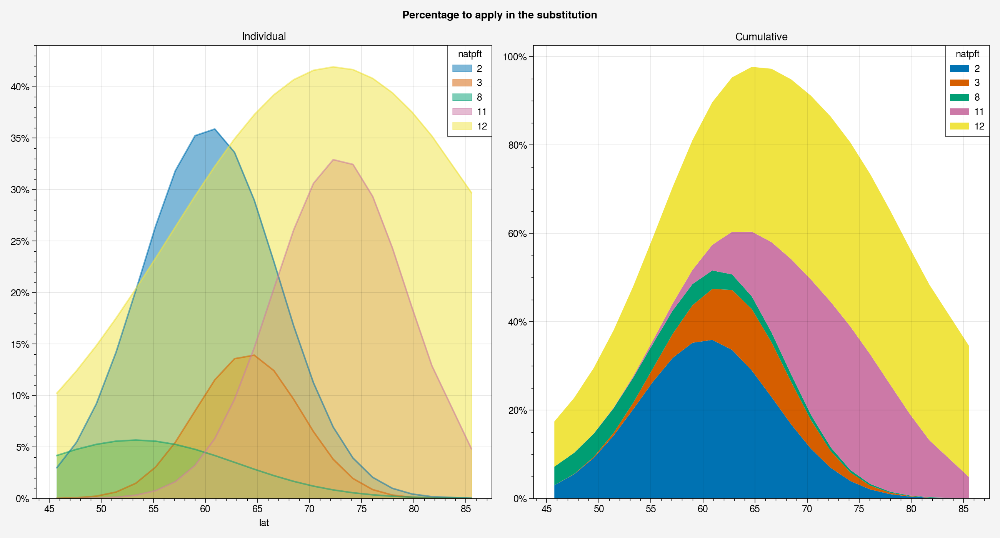

In [84]:
shift=5.
ds_lat_perc=ds_lat.gaussfit.rename('').copy()
ds_lat_perc=ds_lat_perc.assign_coords({'lat': ds_lat_perc.lat+shift})
#filter if the shift is too high
ds_lat_perc=ds_lat_perc.where(ds_lat_perc.lat<=90.)

fig, axes = plt.subplots(1,2,figsize=(13, 7))
series = ds_lat_perc.to_series().unstack()
#series.plot.bar(ax=ax, stacked=True)
series.plot.area(ax=axes[0], stacked=False, title="Individual")

axes[1].stackplot(ds_lat_perc.lat, ds_lat_perc.T)
axes[1].legend(boreal_pfts, title='natpft')
axes[1].set_title("Cumulative")

for b, ax in enumerate(axes.flat):
    vals = ax.get_yticks()
    ax.set_yticklabels(['{0:g}%'.format(x) for x in vals])

plt.suptitle("Percentage to apply in the substitution")

plt.tight_layout()
plt.show()

Need to set percentage label for each pft
plot them separatly

### 2. Longitude function

This will be instead the percentage to apply in the decomposition within the 3 groups: trees, shrubs and grass.

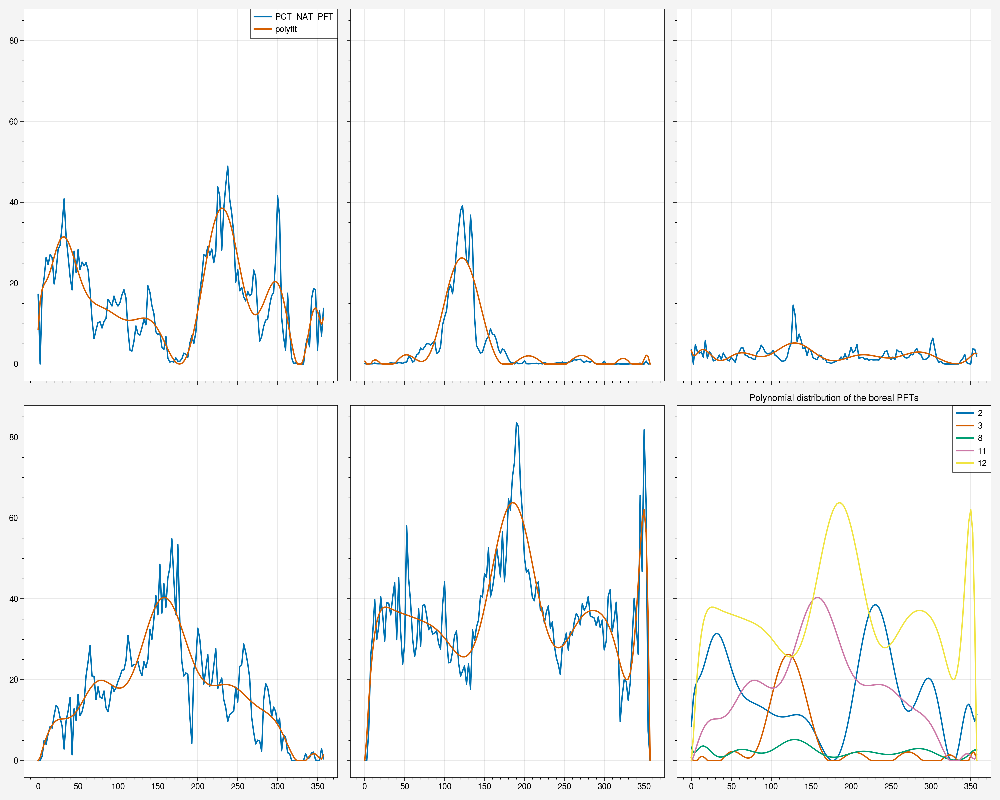

In [192]:
ds = pfts_b_mask.copy()
ds_lon=ds.mean('lat').fillna(0.)
#ds_lon.plot(col='natpft', col_wrap=3)
#plt.show()

out = ds_lon.polyfit(dim="lon", deg=15, full=True)
polyfit = xr.polyval(coord=ds_lon.lon, coeffs=out.polyfit_coefficients).rename('polyfit')
#filter negative, irrealistic values
polyfit=polyfit.where(polyfit>0., 0.)
#polyfit.plot(col='natpft', col_wrap=3)
#plt.show()

ds_lon = xr.merge([ds_lon, polyfit.T])#.plot.line(x='lat',col='natpft', col_wrap=3) #.rename('rawdata')

lines = ['PCT_NAT_PFT','polyfit']

fig, axes = plt.subplots(2, 3, figsize=[15,12], sharex=True, sharey=True)
#fig.delaxes(axes.flatten()[5])

for b, ax in enumerate(axes.flat):
    if b == 5:
        #continue
        #ax.legend(handles=lines)
        #ax.set_visible(False)
        ax.plot(ds_lon.lon, ds_lon['polyfit'].T)
        ax.legend(boreal_pfts)
        ax.set_title("Polynomial distribution of the boreal PFTs")
    else:
        for l in lines:
            ax.plot(ds_lon.lon, ds_lon.isel(natpft= b)[l], label=l)
            #ax.set_ylim(0,90)
            if b==0:
                ax.legend()

#fig.add_axes()
#axes.flat[-1].legend(lines)
plt.tight_layout()
#plt.legend(lines)
plt.show()

### 2b. Longitude: distribution of trees

In [ ]:
# BOREAL NAT PDFs:
# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# - 11: BDS Boreal
# - 12: artic C3 grass

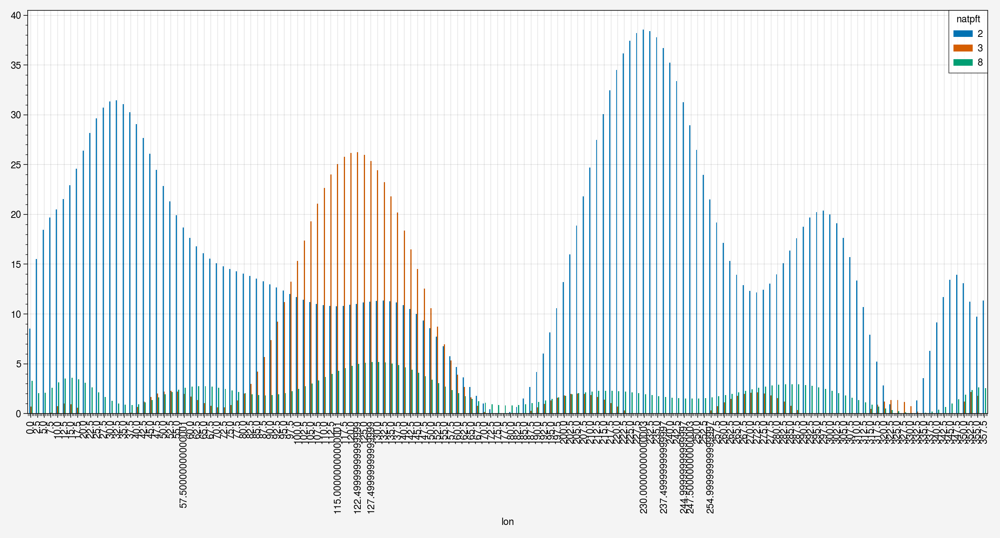

In [193]:
fig, ax = plt.subplots(figsize=(13, 7))
series = ds_lon['polyfit'].sel(natpft=[2,3,8]).T.to_series().unstack()
series.plot.bar(ax=ax)#, stacked=True)
#series.plot.area(ax=axes[0], stacked=False, title="Individual")
plt.tight_layout()
plt.show()

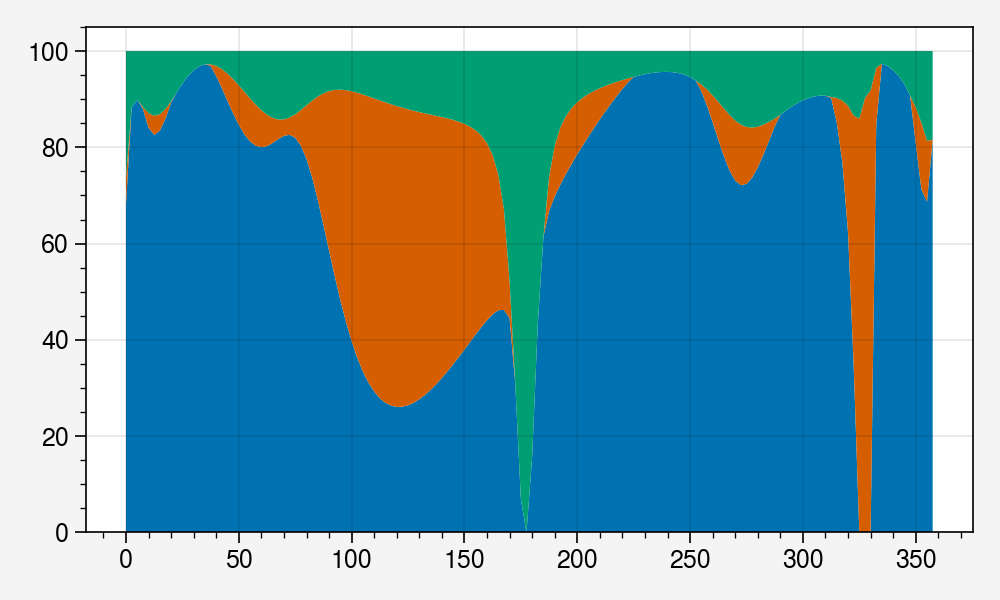

In [194]:
tree_perc= ds_lon['polyfit'].sel(natpft=[2,3,8]).rename('')
tree_perc=tree_perc/tree_perc.sum('natpft').values*100
#tree_norm.plot.line()
fig = plt.figure(1, figsize=[5,3])
plt.stackplot(tree_perc.lon, tree_perc)
#vals = ax.get_yticks()
#plt.set_yticklabels(['{0:g}%'.format(x) for x in vals])
plt.tight_layout()
plt.show()

### 4. Substitution

Rule:
- Trees -> shrubs: [2,3,4] -> [11]
- Shrubs -> grass: [11] -> [12]
- Grass -> bg ??

1. you need to broadcast lat and lon 
2. apply to shrub perc -> substract to shrubes and add to trees..etc
3. check normalization

In [ ]:
def pft_replacement(ds, shift, tune_factor):
    """
    """
    ds
    
    
    
    tpft = [2,3,8]
spft = 11
gpft = 12

In [178]:
pfts_b_mask.sel(natpft=11)

<xarray.DataArray 'PCT_NAT_PFT' (lat: 96, lon: 144)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    natpft   int32 11
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

In [172]:
c=pfts_b_mask.where(pfts_b_mask.lat> 40.).dropna('natpft')
c.plot(col='natpft', col_wrap=3)

ValueError: Number of rows must be a positive integer, not 0

<Figure size 1000x0 with 0 Axes>

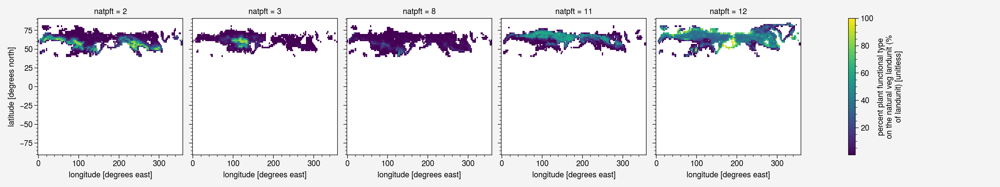

In [173]:
pfts_b_mask.where(pfts_b_mask.lat>40.).plot(col='natpft')

In [222]:
pfts_b_mask.dropna('lat', how='all')

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 5, lat: 68, lon: 144)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * natpft   (natpft) int32 2 3 8 11 12
  * lat      (lat) float64 -78.63 -76.74 -74.84 -72.95 ... 80.53 82.42 84.32
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

In [ ]:
def gaussian(x, A, xc, sig):
    return A*np.exp(-np.power((x - xc),2.) / (2 * np.power(sig,2.)))

ds = pfts_b_mask.copy()
ds_lat=ds.mean('lon').dropna(dim='lat')#fillna(0.)
ds_lat.plot(y='lat', col='natpft', col_wrap=3); plt.show()

#All tests
ds_mean.sel(natpft=2).plot()
#display(list(ds_mean.sel(natpft=2).values))
#display(ds_mean.sel(natpft=2).lat.values)
#plt.show()

from scipy.optimize import curve_fit
xdata = list(ds_mean.sel(natpft=2).lat.values)
ydata = list(ds_mean.sel(natpft=2).values)
p0=[45,55,5]
#plt.plot(xdata,ydata)
popt, pcov = curve_fit(gaussian, xdata, ydata,p0=p0)
#print(pcov)
#plt.plot(xdata, func(xdata, *popt), 'r-')#, label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
#plt.show()


fitted=ds_mean.curvefit(coords='lat', func=gaussian, p0={'A':45, 'xc':55, 'sig':5})
#display(fitted)
popt=fitted.curvefit_coefficients # NO! .values
gaussian(ds_mean.lat, *popt.T).drop('param').plot(y='lat',col='natpft', col_wrap=3)

In [23]:
xr.apply_ufunc(gaussian, ds_mean, *fitted2.curvefit_coefficients.values)#, input_core_dims=[["lat"], ["lat"]])#, exclude_dims=set['natpft'])

NameError: name 'ds_mean' is not defined

In [136]:
ds_mean

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 5, lat: 23)>
array([[7.42718161e-01, 2.22238579e+00, 3.57472306e+00, 1.55261772e+00,
        5.71164692e+00, 7.99599400e+00, 1.74643074e+01, 3.85739590e+01,
        3.61857231e+01, 3.45683672e+01, 3.08828015e+01, 3.14858595e+01,
        2.66363288e+01, 2.01399460e+01, 2.22078843e+01, 1.54683375e+01,
        8.72119720e+00, 2.70969236e+00, 1.48915088e+00, 1.14817462e-01,
        1.04465321e-01, 1.43088658e-01, 2.05480036e-01],
       [2.72792763e-03, 2.99124789e-03, 1.55980366e-03, 9.26426300e-03,
        3.64511536e-01, 6.58068997e-02, 1.74191992e-01, 1.96794310e+00,
        7.02959201e+00, 1.19189751e+01, 9.17929191e+00, 1.07861479e+01,
        1.50162689e+01, 1.40395444e+01, 1.05233458e+01, 5.26845809e+00,
        3.29705040e+00, 1.48740620e+00, 5.95616731e-01, 5.30268991e-02,
        6.52108358e-03, 8.84374508e-03, 6.93791871e-03],
       [4.00355493e-01, 4.30352508e-01, 3.74479525e+00, 4.97480827e+00,
        6.12648460e+00, 5.26762918e+00, 5.87859615e+00, 4.98994037e+00,
        4.48387026e+00, 4.62279670e+00, 4.77924109e+00, 5.09991596e+00,
        2.37111062e+00, 1.48089989e+00, 1.77730412e+00, 1.04771772e+00,
        6.46355224e-01, 3.52022801e-01, 8.25556043e-01, 2.85845473e-02,
        3.43437355e-02, 2.59295320e-02, 1.08585040e-02],
       [1.51480862e-01, 3.53484274e-02, 7.07781436e-03, 7.96018754e-02,
        3.90842446e-02, 2.73848043e-01, 1.89202855e+00, 1.18931436e+00,
        3.60595022e+00, 6.59109719e+00, 1.31255557e+01, 1.44811489e+01,
        1.31239120e+01, 1.66172539e+01, 2.02492912e+01, 2.86882634e+01,
        3.62713121e+01, 3.46382373e+01, 2.93011309e+01, 2.90292108e+01,
        1.93321506e+01, 6.70964841e+00, 6.61398275e-03],
       [4.22684811e+01, 1.87711317e+01, 8.01572815e+00, 1.22086023e+01,
        1.06361063e+01, 2.22896436e+01, 2.21959944e+01, 2.28317930e+01,
        3.17451367e+01, 3.46033491e+01, 3.38957875e+01, 3.41035446e+01,
        3.13889461e+01, 3.08435775e+01, 3.65654384e+01, 3.82673148e+01,
        4.02082060e+01, 4.38402803e+01, 4.90777555e+01, 4.51819962e+01,
        4.19024745e+01, 4.00142903e+01, 1.60813305e+01]])
Coordinates:
  * natpft   (natpft) int32 2 3 8 11 12
  * lat      (lat) float64 35.05 38.84 40.74 42.63 ... 72.95 74.84 76.74 80.53

In [ ]:
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def gaussian_2d(coords, a, xc, yc, xalpha, yalpha):
   ....:     x, y = coords
   ....:     z = a * np.exp(
   ....:         -np.square(x - xc) / 2 / np.square(xalpha)
   ....:         - np.square(y - yc) / 2 / np.square(yalpha)
   ....:     )
   ....:     return z

.curvefit(coords=("lat"), func=plane)

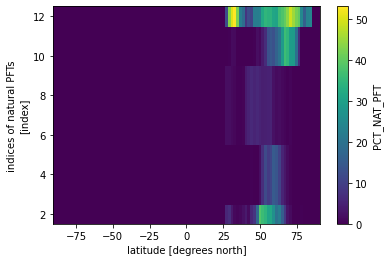

In [36]:
ds = pfts_b_mask.copy()
out=ds.mean('lon').fillna(0.)
out.plot()

In [26]:
out.plot()

ValueError: Dataset.plot cannot be called directly. Use an explicit plot method, e.g. ds.plot.scatter(...)

In [ ]:
ds = pfts_b_mask.copy()
ds = ds.mean('lon')
#ds.plot(y='lat', col ='natpft', col_wrap=3)
out = ds.polyfit(dim="lat", deg=3, full=True)
fitted = xr.polyval(ds.lat, out.polyfit_coefficients)
fitted

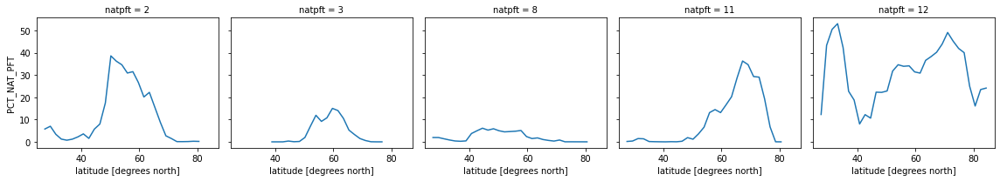

<xarray.DataArray 'PCT_NAT_PFT' (lat: 96)>
array([        nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,  5.76029972,  7.00752772,  3.38604397,
        1.23237214,  0.74271816,  1.20971883,  2.22238579,  3.57472306,
        1.55261772,  5.71164692,  7.995994  , 17.46430736, 38.57395899,
       36.18572311, 34.56836717, 30.88280151, 31.48585954, 26.63632882,
       20.13994601, 22.20788426, 15.46833746,  8.7211972 ,  2.70969236,
        1.48915088,  0.11481746,  0.10446532,  0.14308866,  0.27134593,
        0.20548004,         nan,         nan,         nan,         nan,
               nan])
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0

<xarray.Dataset>
Dimensions:               (degree: 4)
Coordinates:
  * degree                (degree) int64 3 2 1 0
Data variables:
    polyfit_coefficients  (degree) float64 -0.0008449 0.09717 -2.711 17.35

array([-8.44923996e-04,  9.71714908e-02, -2.71059435e+00,  1.73457567e+01])

<xarray.DataArray (lat: 96)>
array([ 1.66433792e+03,  1.58832147e+03,  1.51460623e+03,  1.44315769e+03,
        1.37394138e+03,  1.30692281e+03,  1.24206751e+03,  1.17934098e+03,
        1.11870874e+03,  1.06013631e+03,  1.00358921e+03,  9.49032943e+02,
        8.96433036e+02,  8.45755001e+02,  7.96964356e+02,  7.50026616e+02,
        7.04907297e+02,  6.61571916e+02,  6.19985988e+02,  5.80115031e+02,
        5.41924559e+02,  5.05380090e+02,  4.70447139e+02,  4.37091223e+02,
        4.05277857e+02,  3.74972559e+02,  3.46140843e+02,  3.18748226e+02,
        2.92760225e+02,  2.68142356e+02,  2.44860134e+02,  2.22879076e+02,
        2.02164698e+02,  1.82682516e+02,  1.64398046e+02,  1.47276805e+02,
        1.31284309e+02,  1.16386073e+02,  1.02547615e+02,  8.97344493e+01,
        7.79120932e+01,  6.70460626e+01,  5.71018735e+01,  4.80450423e+01,
        3.98410851e+01,  3.24555179e+01,  2.58538571e+01,  2.00016186e+01,
        1.48643188e+01,  1.04074738e+01,  6.59659969e+00,  3.39721267e+00,
        7.74828910e-01, -1.30503544e+00, -2.87686420e+00, -3.97514123e+00,
       -4.63435035e+00, -4.88897541e+00, -4.77350024e+00, -4.32240868e+00,
       -3.57018457e+00, -2.55131174e+00, -1.30027404e+00,  1.48444705e-01,
        1.76036065e+00,  3.50098995e+00,  5.33584878e+00,  7.23045330e+00,
        9.15031966e+00,  1.10609640e+01,  1.29279026e+01,  1.47166515e+01,
        1.63927269e+01,  1.79216449e+01,  1.92689218e+01,  2.04000736e+01,
        2.12806166e+01,  2.18760669e+01,  2.21519407e+01,  2.20737541e+01,
        2.16070233e+01,  2.07172645e+01,  1.93699938e+01,  1.75307273e+01,
        1.51649813e+01,  1.22382719e+01,  8.71611531e+00,  4.56402762e+00,
       -2.52474975e-01, -5.76787632e+00, -1.20166602e+01, -1.90333106e+01,
       -2.68523112e+01, -3.55081459e+01, -4.50352985e+01, -5.54682530e+01])
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0

LinAlgError: SVD did not converge in Linear Least Squares

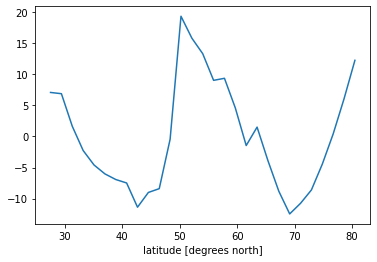

In [129]:
ds = pfts_b_mask.copy()
ds = ds.mean('lon')
ds.plot(col='natpft')
plt.show()
ds = ds.sel(natpft=2)
ds = ds.drop_vars('natpft')
display(ds)
out = ds.polyfit(dim='lat',deg=3)
display(out)
display(np.transpose(out.polyfit_coefficients.values))
a = xr.polyval(ds['lat'],out.polyfit_coefficients)
display(a)
b= ds-a
b.plot()

def detrend_dim(da, dim, deg=1):
    # detrend along a single dimension
    ds=da.copy()
    ds=ds.fillna
    p = da.polyfit(dim=dim, deg=deg, skipna=False)
    fit = xr.polyval(da[dim], p.polyfit_coefficients)
    return da - fit

detrend_dim(ds,'lat',3)

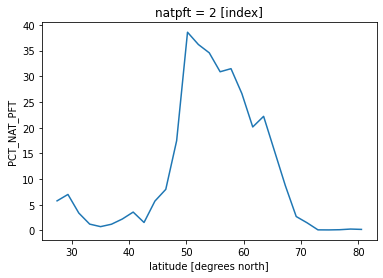

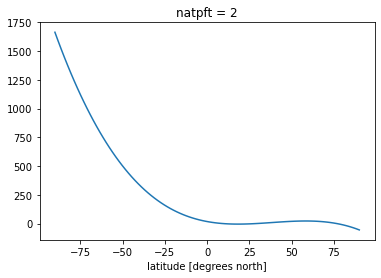

In [77]:
ds.sel(natpft=2).plot()
plt.show()
fitted.sel(natpft=2).plot()

In [72]:
out

<xarray.Dataset>
Dimensions:               (degree: 4, natpft: 5)
Coordinates:
  * degree                (degree) int64 3 2 1 0
  * natpft                (natpft) int64 2 3 8 11 12
Data variables:
    lat_matrix_rank       int64 4
    lat_singular_values   (degree) float64 1.384 1.321 0.5046 0.2888
    polyfit_coefficients  (degree, natpft) float64 -0.0008449 ... 292.3
    polyfit_residuals     (natpft) float64 2.183e+03 289.9 52.59 853.7 3.119e+03

In [59]:
# Example data
da = xr.DataArray(np.random.randn(20, 180, 360),
                  dims=('time', 'lat', 'lon'),
                  coords={'time': np.linspace(0,19, 20), 
                  'lat': np.linspace(-90,90,180), 
                  'lon': np.linspace(0,359, 360)})

# define a function to compute a linear trend of a timeseries
def linear_trend(x):
    pf = np.polyfit(x.time, x, 1)
    # need to return an xr.DataArray for groupby
    return xr.DataArray(pf[0])

# stack lat and lon into a single dimension called allpoints
stacked = da.stack(allpoints=['lat','lon'])
# apply the function over allpoints to calculate the trend at each point
trend = stacked.groupby('allpoints').apply(linear_trend)
# unstack back to lat lon coordinates
trend_unstacked = trend.unstack('allpoints')

In [58]:
fit?

Object `fit` not found.


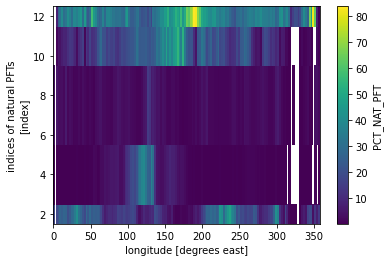

In [171]:
pfts_b_mask.where(pfts_b_mask>0.).mean('lat').plot(x='lon')

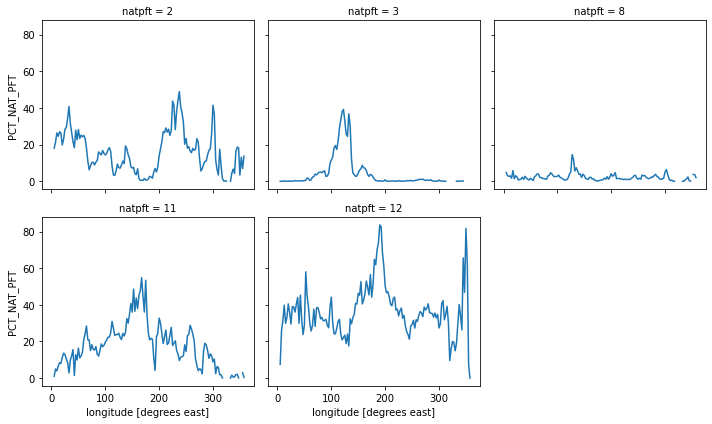

In [31]:
pfts_b_mask.where(pfts_b_mask>0.).mean('lat').plot(x='lon', col='natpft', col_wrap=3)

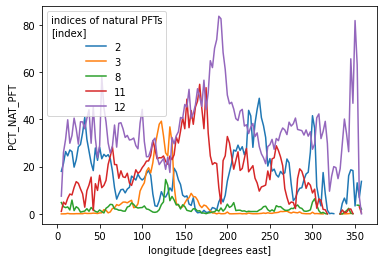

In [200]:
pfts_b_mask.where(pfts_b_mask>0.).mean('lat').plot.line(x='lon')

## Notes on what I learnt

### Surface

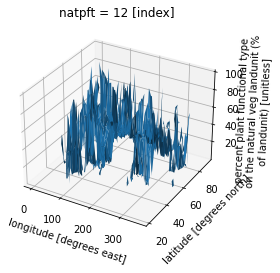

In [19]:
pfts_b_mask.sel(natpft=12).where(pfts_b_mask.lat>20, drop=True).plot.surface()

In [90]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

import xarray as xr

# Read the data
url = 'https://github.com/mapbox/rasterio/raw/master/tests/data/RGB.byte.tif'
da = xr.open_rasterio(url)

# The data is in UTM projection. We have to set it manually until
# https://github.com/SciTools/cartopy/issues/813 is implemented
crs = ccrs.UTM('18N')

# Plot on a map
ax = plt.subplot(projection=crs)
da.plot.imshow(ax=ax, rgb='band', transform=crs)
ax.coastlines('10m', color='r')
plt.show()

ModuleNotFoundError: No module named 'rasterio'

In [ ]:
proj = ccrs.PlateCarree()
map_proj = ccrs.Orthographic(0, 90)

#p = air.plot(transform=ccrs.PlateCarree(),  # the data's projection
             #col='ntaptf', col_wrap=3,  # multiplot settings
             #aspect=ds.dims['lon'] / ds.dims['lat'],  # for a sensible figsize
             #subplot_kws={'projection': map_proj})  # the plot's projection

#fig, axs = plt.subplots(2,3,subplot_kw={'projection': ccrs.Orthographic(0, 90)},figsize=(15,10))


fig = plt.figure(1, figsize=[13,13],dpi=300)

#ax = plt.axes(projection=ccrs.Orthographic(0, 90))

#ax.add_feature(cartopy.feature.OCEAN, zorder=0)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black')
#functions.polarCentral_set_latlim([65,90], ax)
#axs.coastlines()
#axs.gridlines()
p=pfts_b_mask.plot.pcolormesh(x='lsmlon', y='lsmlat', col='natpft', col_wrap=3, robust=True,cmap='Greens', transform=proj, subplot_kws={'projection':map_proj})#transform=ccrs.PlateCarree())
for ax in p.axes.flat:
    ax.coastlines()
    ax.set_aspect('equal', 'box-forced')
#ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=0.3)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=0.3)
#url = 'http://map1c.vis.earthdata.nasa.gov/wmts-geo/wmts.cgi'
#ax.add_wmts(url, 'BlueMarble_NextGeneration')
plt.show()

In [ ]:
for ax, title in zip(g.axes.flat, list("abcd")):
    ax.set_title(title)

In [ ]:
#REGREDING: https://github.com/NCAR/ctsm_python_gallery/blob/master/notebooks/PFT-Gridding.ipynb
#to visualize: http://localhost:8889/notebooks/Desktop/forces-2021/content/learning/example-notebooks/projections.ipynb

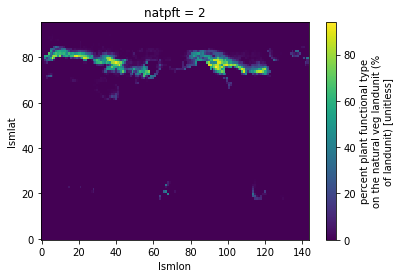

In [17]:
dset_in.PCT_NAT_PFT.isel(natpft=2).plot()

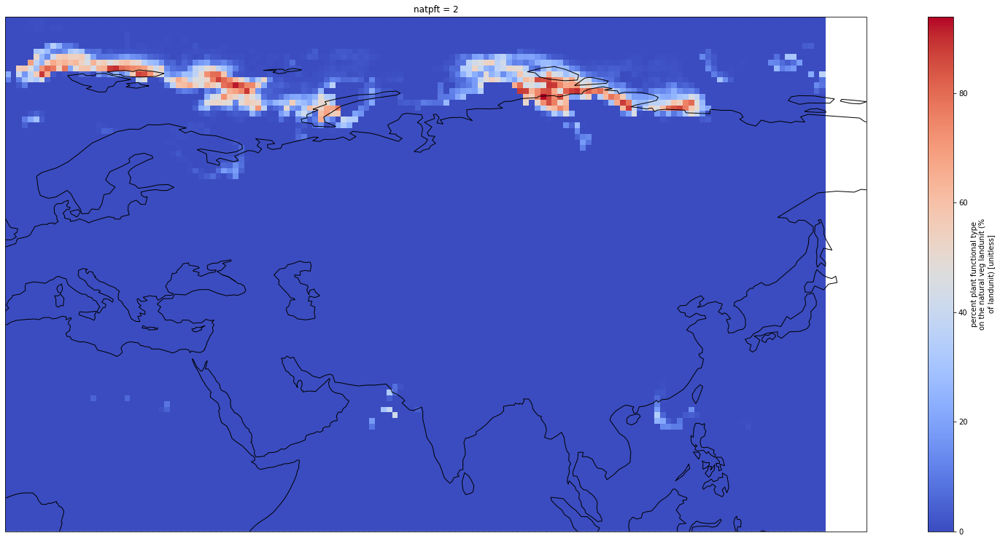

In [18]:
fig = plt.figure(1, figsize=[30,13])
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines()

dset_in.PCT_NAT_PFT.isel(natpft=2).plot.pcolormesh(ax=ax, x='lsmlon', y='lsmlat', cmap='coolwarm')

NameError: name 'lon' is not defined

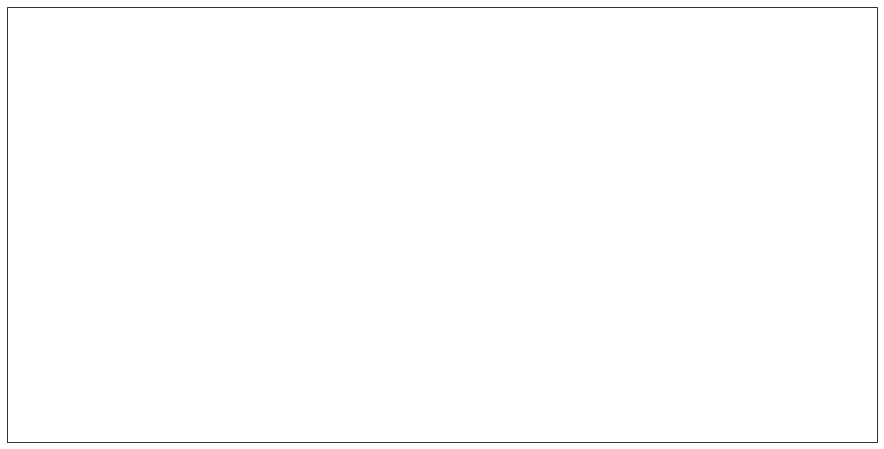

In [147]:
plt.figure(figsize=(20,8))

#Define projection
ax = plt.axes(projection=ccrs.PlateCarree())

#plot the data
plt.contourf(lon,lat,var_srf,cmap='Spectral_r')

# add coastlines
ax.add_feature(cfeature.COASTLINE)

#add lat lon grids
gl = ax.gridlines(draw_labels=True, color='lightgrey', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False

# Titles
# Main
plt.title("Global map of CAM-chem CO, January 2018",fontsize=18)

# y-axis
ax.text(-0.04, 0.5, 'Latitude', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes)
# x-axis
ax.text(0.5, -0.08, 'Longitude', va='bottom', ha='center',
        rotation='horizontal', rotation_mode='anchor',
        transform=ax.transAxes)
# legend
ax.text(1.15, 0.5, 'CO (ppb)', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes)

plt.colorbar()
plt.show()

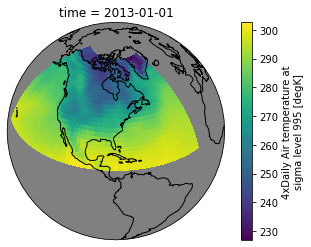

In [12]:
import cartopy.crs as ccrs

air = xr.tutorial.open_dataset("air_temperature").air

p = air.isel(time=0).plot(subplot_kws=dict(projection=ccrs.Orthographic(-80, 35), facecolor="gray"),transform=ccrs.PlateCarree(),)
p.axes.set_global()
p.axes.coastlines()